# Notebook to investigate the contribution of the MSSF to our observed merger rate

In [907]:
import h5py as h5
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import astropy.units as u
from astropy import constants as const
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from astropy.cosmology import WMAP9, z_at_value
from astropy.cosmology import Planck18  as cosmo# Planck 2018
from astropy.cosmology import z_at_value

from astropy.table import Table, Column
import os
# import KDE_functions as CI 
        
    
def Mchirp(m1, m2):
    chirp_mass = np.divide(np.power(np.multiply(m1, m2), 3./5.), np.power(np.add(m1, m2), 1./5.))
    return chirp_mass    
   
save_loc    =  '/Users/lieke/surfdrive/Documents/CompareCOMPAS/plots/'
    
proj_dir    = '/Volumes/TOSHIBA_EXT/'#'/n/de_mink_lab/Users/lvanson/'
base_dir    = proj_dir+'/CompasOutput/'
data_dir    = base_dir+ '/v02.17.18/N1e6_CoolWind_fWR_LBV/'#'/N1e6_CoolWind_fWR/'#'/N1e5_fWR_CoolWind_LBVpresc/'  #'N1e5_fWR_allWind/'#'Ne7Grid_alpha01_10_fWR01_10/'

plt.rc('font', family='serif')

##PLOT setttings
from matplotlib import rc
import matplotlib
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('text', usetex=True)
fsize, SMALL_SIZE, MEDIUM_SIZE, BIGGER_SIZE = 30,25,25,30
for obj in ['axes','xtick','ytick']:
    plt.rc(obj, labelsize=MEDIUM_SIZE)          # controls default text sizes
for obj in ['figure','axes']:
    plt.rc(obj, titlesize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize




# make nice colour range

In [908]:
def plot_examples(colormaps):
    """
    Helper function to plot data with associated colormap.
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)
    n = len(colormaps)
    fig, axs = plt.subplots(1, n, figsize=(n * 2 + 2, 3),
                            constrained_layout=True, squeeze=False)
    for [ax, cmap] in zip(axs.flat, colormaps):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()

(20, 4)


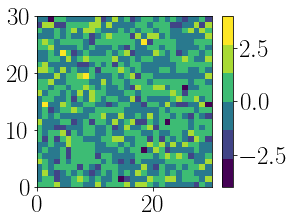

(20, 4)


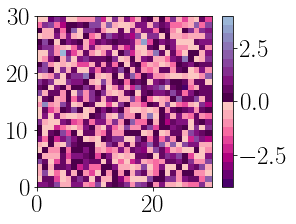

In [909]:

#########################################
Oranges = cm.get_cmap('viridis',100)
c1    = Oranges(np.linspace(0., 0.45, 10))

Greens = cm.get_cmap('viridis',100)
c2    = Greens(np.linspace( 0.6, 1.,10))

new = np.append(c1,c2, axis=0)
print(np.shape(new))
newcmp = ListedColormap(new)
viridis_colormap = newcmp(np.linspace(0, 1, 6))
# colormap = colormap[0:25]
newcmp = ListedColormap(viridis_colormap)


plot_examples([newcmp])



#########################################
Oranges = cm.get_cmap('RdPu_r',100)
c1    = Oranges(np.linspace(0., 0.75, 10))

Greens = cm.get_cmap('BuPu_r',100)
c2    = Greens(np.linspace( 0., 0.6,10))

new = np.append(c1,c2, axis=0)
print(np.shape(new))
RdPuBu = ListedColormap(new)
RdPuBu_colormap = RdPuBu(np.linspace(0, 1, 6))
# colormap = colormap[0:25]
newcmp = ListedColormap(RdPuBu_colormap)


plot_examples([RdPuBu])



# Read a simulation

In [910]:

#########################################
#
#########################################
def read_data(loc = data_dir+'/output/COMPAS_Output_wWeights.h5', 
              rate_key = 'Rates_Z00.035_alpha%s_sigma0.39'%(-0.23), maxz=1.0):
    """
    Function to read the DCO and SYS data and add relevant columns and info needed to plot
    """
    
    def hdf5_to_astropy(hdf5_file, group = 'SystemParameters' ):
        """convert your hdf5 table to astropy.table for easy indexing etc
        hdf5_file  =  Hdf5 file you would like to convert
        group      =  Data group that you want to acces
        """
        Data         = hdf5_file[group]#
        table = Table()
        for key in list(Data.keys()):
            table[key] =  Data[key]
        return table

    
    print('Reading ',loc)
    ################################################
    ## Open hdf5 file
    File        = h5.File(loc ,'r')
    print(File.keys())
    ## Mask from DCO to merging BBH (W_i != 0 )
    DCO_mask   = File[rate_key]['DCO_mask'][()]
    redshhifts = File[rate_key]['redshifts'][()]
    
    # Pour into astropy table
    DCO         = hdf5_to_astropy(File, group = 'DoubleCompactObjects' )  
    SYS         = hdf5_to_astropy(File, group = 'SystemParameters' )  
    
    ## Only sum your rates up to some max redshift 
    z_index = np.digitize(maxz, redshhifts) -1
    print('max(redshift) in data', max(redshhifts), '\n max redshift used: redshift[z_index]', redshhifts[z_index])
    W_i        = File[rate_key]['merger_rate'][()]
    Weight     = np.sum(W_i[:,:z_index]/(1+redshhifts[:z_index]), axis = 1)  
    W_io3      = File[rate_key]['detection_rateO3'][()]
    WeightO3   = np.sum(W_io3, axis = 1)

    ################################################
    ## Adding columns ##
    ################################################
    ## Adding columns ##
    SYS_DCO_seeds_bool          = np.in1d(SYS['SEED'], DCO['SEED']) #Bool to point SYS to DCO
    q_init                      = SYS['Mass@ZAMS(2)']/SYS['Mass@ZAMS(1)']
    DCO['q_init']               = q_init[SYS_DCO_seeds_bool]
    DCO['Stellar_Type@ZAMS(1)'] = SYS['Stellar_Type@ZAMS(1)'][SYS_DCO_seeds_bool]
    DCO['Stellar_Type@ZAMS(2)'] = SYS['Stellar_Type@ZAMS(2)'][SYS_DCO_seeds_bool]
    DCO['tDelay']               = DCO['Coalescence_Time'] + DCO['Time'] #Myr
    DCO['M_moreMassive']        = np.maximum(DCO['Mass(1)'], DCO['Mass(2)'])
    DCO['M_lessMassive']        = np.minimum(DCO['Mass(1)'], DCO['Mass(2)'])

    ################################################
    File.close()
    
    return SYS, DCO, DCO_mask, Weight, WeightO3


# SFR(z) Madau & Dickenson 2014 shape

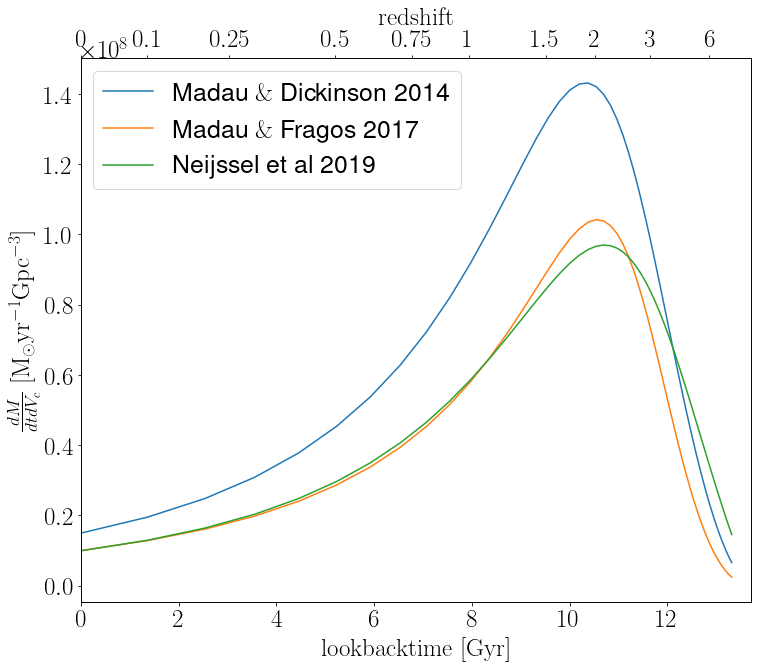

In [911]:

########################################################
##
########################################################
def Madau_Dickinson2014(z, a=0.015, b=2.77, c=2.9, d=5.6):
    dm_dtdMpc = a * (1 + z)**b/( 1 + ( (1+z)/c )**d ) *u.Msun *u.yr**-1 *u.Mpc**-3
    return dm_dtdMpc.to(u.Msun *u.yr**-1 *u.Gpc**-3).value # Msun year-1 Mpc-3 

redshift_list  = np.linspace(0,10, num=100)

########################################################
# Start plotting
fig, ax = plt.subplots(figsize=(12,10))

#default M&D 14
plt.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list), label = 'Madau $\&$ Dickinson 2014')

#default Madau & Fragos 17
plt.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list, a=0.01, b=2.6, c=3.2, d=6.2), label = 'Madau $\&$ Fragos 2017')

#default Coen
plt.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list, a=0.01, d=4.7), label = 'Neijssel et al 2019')
ax.set_xlabel('$\mathrm{lookbacktime \ [Gyr]}$')


#### Age Universe Axis ####
ax2 = ax.twiny()

redshift_tick_list = [0,0.1, 0.25, 0.5, 0.75, 1.0,1.5, 2, 3, 6, ]
# Find loockback location for each of our ages
z_ticks = [cosmo.lookback_time(z) for z in redshift_tick_list]

# And annotate the tick labels :)
ax2.set_xticks([cosmo.lookback_time(z).value for z in redshift_tick_list])
ax2.set_xticklabels(['${:g}$'.format(z) for z in redshift_tick_list])
ax2.set_xlabel('$\mathrm{redshift}$')

# Make sure top and bottom axis are lined up (have same limmits)
tmin, tmax = 0.0, 13.7
ax.set_xlim(tmin, tmax)
ax2.set_xlim(tmin, tmax)

# Plot values
ax.set_ylabel(r'$\frac{dM}{dt dV_c}$ $\mathrm{[M_{\odot} yr^{-1} Gpc^{-3}]}$')
ax.legend()
plt.show()
    


    

# Get dP/dZ

metallicity density distribution


In [989]:
def get_metallicity_distribution(min_logZ  =-12.0, max_logZ  =0.0, step_logZ = 0.01,
                                 min_logZ_COMPAS = np.log(1e-4),max_logZ_COMPAS = np.log(0.03),
                                 max_redshift = 10.0,redshift_step = 0.01,
                                 Z0=0.035, alpha=-0.23, sigma=0.39, s_factor = 0.0):
    """
    Calculate the distribution of metallicities at different redshifts using Neijssel+19 Eq.7-9
    (which is based on Madau & Dickinson 2014)

    NOTE: This assumes that metallicities in COMPAS are drawn from a flat in log distribution

    Args:
        redshifts          --> [list of floats] List of redshifts at which to calculate things
        min_logZ_COMPAS    --> [float]          Minimum logZ value that COMPAS samples
        max_logZ_COMPAS    --> [float]          Maximum logZ value that COMPAS samples
        Z0                 --> [float]          Parameter used for calculating metallicity density dist
        alpha              --> [float]          Parameter used for calculating metallicity density dist
        sigma              --> [float]          Parameter used for calculating metallicity density dist
        min_logZ           --> [float]          Minimum logZ at which to calculate dPdlogZ
        max_logZ           --> [float]          Maximum logZ at which to calculate dPdlogZ
        step_logZ          --> [float]          Size of logZ steps to take in finding a Z range

    Returns:
        dPdlogZ            --> [2D float array] Probability of getting a particular logZ at a certain redshift
        metallicities      --> [list of floats] Metallicities at which dPdlogZ is evaluated
        p_draw_metallicity --> float            Probability of drawing a certain metallicity in COMPAS (float because assuming uniform)
    """
    ##################################
    redshifts = np.arange(0, max_redshift + redshift_step, redshift_step)
    #print('redshifts', redshifts, 'N redshifts', len(redshifts))

    ##################################
    # Experiment with redshift dependence sigma
    Sigma = sigma * 10**(s_factor * redshifts)
    
    # use Neijssel+19 Eq. 9 to find means
    mean_metallicities = Z0 * 10**(alpha * redshifts)
    mu_metallicities = np.log(mean_metallicities) - Sigma**2/2
    #print('mean_metallicities', mean_metallicities, 'mu_metallicities', mu_metallicities)
    
    # create a range of metallicities
    log_metallicities = np.arange(min_logZ, max_logZ + step_logZ, step_logZ)
    metallicities = np.exp(log_metallicities)
    #print('metallicities', metallicities, 'N metallicities', len(metallicities))

    # use Neijessel+19 Eq. 7 to find probabilities (without the factor of 1/Z since this is dp/dlogZ not dp/dZ)
    dPdlogZ = 1./(Sigma[:,np.newaxis] * np.sqrt(2*np.pi)) * np.exp(-(log_metallicities - mu_metallicities[:,np.newaxis])**2 /(2 * Sigma[:,np.newaxis]**2) )

    #print('dPdlogZ', dPdlogZ)#Shape is (redshifts, log_metallicities)
    # len(dPdlogZ[0,:]) = metallicities, len(dPdlogZ[:,0]) = redshifts

    # normalise the distribution
    norm = dPdlogZ.sum(axis=1) * step_logZ
    dPdlogZ = dPdlogZ / norm[:,np.newaxis]
    #print('Normalized: np.sum(dPdlogZ,axis=1)', np.sum(dPdlogZ,axis=1))

    #We have to normalize to account for the sampled range of metalliciities. We sample metallicies in COMPAS uniformly in log

    # assume a flat in log distribution in metallicity to find probability of drawing Z
    p_draw_metallicity = 1 / (max_logZ_COMPAS - min_logZ_COMPAS)
    
    return dPdlogZ, redshifts, metallicities, p_draw_metallicity



# Figure 3: Redshift-Metallicity plane

In [1118]:

from matplotlib import ticker, cm

def metal_contours(x = None, y = None, z = None, tmin = 0.0, tmax = 14.5,
                   DCO= None, DCO_mask = None,
                   param1 = 'fWR', p1 = 1.0, param2 = 'coolWind', p2 =1.0,
                   redshift_list = np.linspace(0,10, num=100),
                  kleur = cm.PuBu, kleurlabel = '$\gamma = -0.23$',savestr ='fid',
                  min_logZ_COMPAS = np.log(1e-4),max_logZ_COMPAS = np.log(0.03)):
    '''
    x, y, z             ---------------> redshift/lookback time, metallicities, dP/dZ
    tmin,tmax           ---------------> min and max time in Gyr to show as xlim 
    DCO, DCO_mask       ---------------> table of double compact objects, + mask of which to include in plot 
    redshift_list       ---------------> redshifts to use for SFR
    kleur, kleurlabel   ---------------> colour/colour label of contour
    savestr             ---------------> string added to save name of plot
    min_logZ_COMPAS     ---------------> min ln(metal) that ocurs in COMPAS
    max_logZ_COMPAS     ---------------> max ln(metal) that ocurs in COMPAS
    '''
    # Create the Figure
    fig = plt.figure(figsize = (18,16))
    
    # Add a grid
    gs = fig.add_gridspec(nrows=3, ncols=1, hspace=0.65)
    # axis for the SFR
    ax_top = fig.add_subplot(gs[0, :])
    # Axis for the main plot
    ax = fig.add_subplot(gs[1:3, :])

    ##############################################################################
    ######################################
    # Plot SFR 
    #default Madau & Fragos 17
    ax_top.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list, a=0.01, b=2.6, c=3.2, d=6.2),
                lw=3, color= 'grey', linestyle='--', label = 'Madau $\&$ Fragos 2017')

    #default Coen
    ax_top.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list, a=0.01, d=4.7),
                lw=3, color= 'brown', label = 'Neijssel et al 2019')
    ax_top.set_xlabel('$\mathrm{lookbacktime \ [Gyr]}$')

    #default M&D 14
    #ax_top.plot(cosmo.lookback_time(redshift_list), Madau_Dickinson2014(redshift_list), label = 'Madau $\&$ Dickinson 2014')
    
    # Plot values
    ax_top.set_xlim(tmin, tmax)
    ax_top.set_ylabel('$\mathrm{dM_{SFR} \ M_{\odot} \ yr^{-1} \ Gpc^{-3}}$')
    ax_top.xaxis.grid(5) # vertical lines
    ax_top.legend()
    
    ##############################################################################
    ######################################
    # Plot the contours of the metallicity density
    levels = [1e-10,1e-5, 1e-4,1e-3, 1e-2, 1e-1,8]#np.logspace(-4, 0., 10+1)
#     levels = [1e-3,1e-2,1e-1,1e0,1e2,1e3, 1e4,1e5,1e7,1e8,1e9]#np.logspace(-4, 0., 10+1)
    
    cs = ax.contourf(x, y, z, levels, cmap=kleur, 
                     locator=ticker.LogLocator(), alpha = 0.95 )
    cbaxes = fig.add_axes([0.925, 0.125, 0.03, 0.475]) #[left, bottom, width, height],
    cb = plt.colorbar(cs, cax = cbaxes, label= kleurlabel)  
    
    kleur = '#de8f4e'#'#f67280' (Used for all COMPAS things)
    ######################################
    ## Show boundaries of COMPAS
    ax.hlines(np.e**min_logZ_COMPAS, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = kleur, lw = 4, ls = '-')
    ax.text(1.,np.e**min_logZ_COMPAS - 0.00005, '$min Z simulated$', color = kleur, size =25)

    ax.hlines(np.e**max_logZ_COMPAS, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = kleur, lw = 4, ls = '-')
    ax.text(0.7,0.725, '$max Z simulated$', color = kleur,transform=ax.transAxes, size =25)
    
    ## And Zsun
    ax.hlines(0.014, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = 'k', lw = 4, ls = ':')
    ax.text(0.7, 0.62, '$Z=Z_{\odot}$', color = 'k', va='top',transform=ax.transAxes, size =25)
    
    #c06c84
    ######################################
    # Scatter the mergning BBHs assuming they all merge at z = 0
    # from Myr to Gyr
#     one_CE = DCO['M_moreMassive']>25#DCO['CE_Event_Count'] > 0
#     DCO_mask = DCO_mask#*one_CE
#     print(len(DCO['tDelay'][DCO_mask]))
#     scat = ax.scatter(DCO['tDelay'][DCO_mask]*1e-3, DCO['Metallicity@ZAMS(1)'][DCO_mask], 
#                label = 'COMPAS '+param1+str(p1)+param2+str(p2), s = DCO['mixture_weight'][DCO_mask]*10, 
#                c=DCO['M_moreMassive'][DCO_mask], cmap = 'RdYlGn_r' ,vmin =2.5, vmax = 45)
#     cbaxes1 = fig.add_axes([0.125, 0.0,0.8 , 0.02]) #[left, bottom, width, height],
#     cb = plt.colorbar(scat, cax = cbaxes1, label='$M_{\mathrm{BH},1}$', orientation = 'horizontal')  
#     #                facecolors='none', edgecolors=kleur) 
#     ax.legend(loc ='lower left',markerscale=5)
    
    
    ###################
    #Plotvalues
    ax.xaxis.grid(5) # vertical lines
    ax.set_yscale('log')
    ax.set_xlabel('$\mathrm{Lookback time [Gyr]}$')
    ax.set_ylabel('Metallicity')
    
    ######################################
    #### Add redshift Axis ####
    ax2 = ax.twiny()

    redshift_tick_list = [0,0.1, 0.25, 0.5, 0.75, 1.0,1.5, 2, 3, 6, 10]
    # Find loockback location for each of our ages
    z_ticks = [cosmo.lookback_time(z) for z in redshift_tick_list]

    # And annotate the tick labels :)
    ax2.set_xticks([cosmo.lookback_time(z).value for z in redshift_tick_list])
    ax2.set_xticklabels(['${:g}$'.format(z) for z in redshift_tick_list])
    ax2.set_xlabel('$\mathrm{redshift}$')

    # Make sure top and bottom axis are lined up (have same limmits)
    ax.set_xlim(tmin, tmax)
    ax2.set_xlim(tmin, tmax)
    
#     print('saving here', save_loc + 'RedshiftMetal_Plane1.pdf')
    plt.savefig(save_loc + 'RedshiftMetal_Plane'+savestr+'.jpg',  bbox_inches='tight')
    
    plt.show()

    



# Example of fiducial model

In [1187]:
### ## Reading file ##
fnamestr ='LBVHURLEY_ADD'# 'LBVBELCZYNSKI'#'LBVHURLEY_ADD'#'['BELCZYNSKI', 'HURLEY_AD']
param1   = 'fWR'
p1       = 1.0
param2   = 'coolWind'
p2       = 0.1
Palpha   = -0.23

rate_key = 'Rates_Z00.035_alpha%s_sigma0.39'%(Palpha)
max_redshift = 0.01

### Get data
filename    = fnamestr+param1+str(p1)+param2+str(p2)
print(filename)
SYS, DCO, DCO_mask, Weight, WeightO3 = read_data(loc = data_dir+filename+'/output/COMPAS_Output_wWeights.h5', 
              rate_key = rate_key, maxz=max_redshift)



LBVHURLEY_ADDfWR1.0coolWind0.1
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR1.0coolWind0.1/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


max value of dPdlogZ 5.834564067783717
redshifts [0.000e+00 1.000e-02 2.000e-02 ... 1.098e+01 1.099e+01 1.100e+01] 1101
t_lookback [ 0.          0.14346205  0.28484219 ... 13.3722385  13.37275843
 13.37327727] Gyr

sfr [ 9933346.18967071 10207683.75120146 10486626.08501805 ...
 12339478.72278307 12319685.1393889  12299939.52967117]


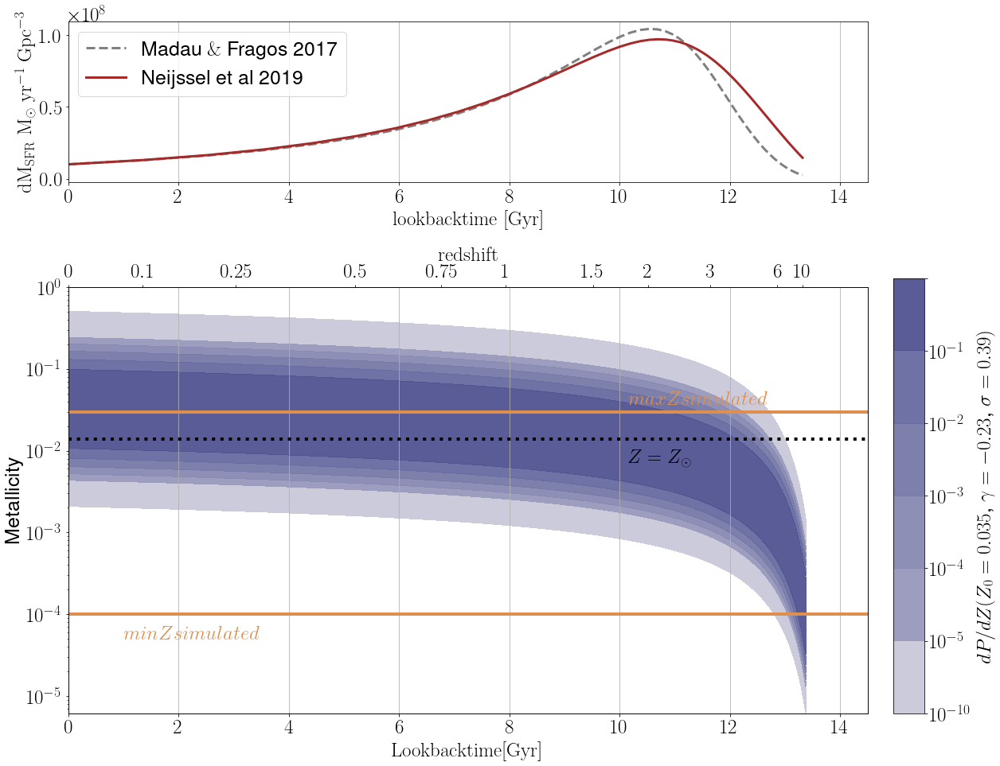

In [1188]:

####################################################
Z0,sigma,  =0.035, 0.39
Pa = -0.23

# Get dPdZ 
dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, max_redshift = 11.0)
print('max value of dPdlogZ', np.amax(dPdlogZ )/p_draw_metallicity )

#Convert redshift to lookback time
t_lookback = cosmo.lookback_time(redshifts)
print('redshifts', redshifts, len(redshifts))
print('t_lookback', t_lookback)

# Get the SFR
sfr = Madau_Dickinson2014(redshifts, a=0.01, d=4.7)
print()
print('sfr', sfr)
# Convert redshifts to volumnes and ensure all volumes are in Gpc^3
volumes = cosmo.comoving_volume(redshifts).to(u.Gpc**3).value

# split volumes into shells and duplicate last shell to keep same length
shell_volumes = np.diff(volumes)
shell_volumes = np.append(shell_volumes, shell_volumes[-1])
# print('shell_volumes', shell_volumes)
# print('sfr*shell_volumes', sfr*shell_volumes)
# print('max(sfr*shell_volumes)',  max(sfr*shell_volumes) )


####################################################
# make a nice colour range
color_pallette = sns.light_palette(colormap[1], as_cmap=True, n_colors= 2)#colormap[1]'#543884'
# sfr*shell_volumes*

# Plot it!
metal_contours(x = t_lookback, y = metallicities, z =dPdlogZ.T/p_draw_metallicity,savestr ='0.15', 
               DCO= DCO, DCO_mask = DCO_mask,
               param1 = 'fWR', p1 = p1, param2 = 'coolWind', p2 =p2,
               kleur = color_pallette, kleurlabel ='$dP/dZ($'+"$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma)+'$)$' )

# 
# '$\mathrm{MSSFR \ [M_{\odot} \ yr^{-1}]}$'+ "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma) 



In [1189]:
import matplotlib
import h5py
from pylab import *



from matplotlib import ticker, cm

def metal_contours_TNG(x = None, y = None, z = None, tmin = 0.0, tmax = 14.5,
                   DCO= None, DCO_mask = None, scatter = False, W_i = DCO['mixture_weight'][DCO_mask],
                   param1 = 'fWR', p1 = 1.0, param2 = 'coolWind', p2 =1.0,
                   redshift_list = np.linspace(0,10, num=100),
                  kleur = cm.PuBu, kleurlabel = '$\gamma = -0.23$',savestr ='fid',
                  min_logZ_COMPAS = np.log(1e-4),max_logZ_COMPAS = np.log(0.03)):
    '''
    x, y, z             ---------------> redshift/lookback time, metallicities, dP/dZ
    tmin,tmax           ---------------> min and max time in Gyr to show as xlim 
    DCO, DCO_mask       ---------------> table of double compact objects, + mask of which to include in plot 
    redshift_list       ---------------> redshifts to use for SFR
    kleur, kleurlabel   ---------------> colour/colour label of contour
    savestr             ---------------> string added to save name of plot
    min_logZ_COMPAS     ---------------> min ln(metal) that ocurs in COMPAS
    max_logZ_COMPAS     ---------------> max ln(metal) that ocurs in COMPAS
    '''
    # Create the Figure
    fig, ax = plt.subplots(figsize = (20,16))
    
    ##############################################################################
    ######################################
    TNGlocation = '/Users/lieke/surfdrive/Documents/CompareCOMPAS/'

    with h5py.File(TNGlocation+"SFRMetallicityFromGasTNG100.hdf5", "r") as f:
        MetalBins     = 10**f["MetalBins"][:]
        Lookbacktimes = f["Lookbacktimes"][:]
        Sfr           = f["Sfr"][:]
    # Convert SFR from sfr/box to sfr Mpc-3
    littleh = 0.67
    Rbox = (75*u.Mpc)/littleh
    
    cosmic_SFR = Sfr.T * Rbox**3

    TNG = ax.pcolormesh(Lookbacktimes, np.log10(MetalBins), Sfr.T, 
                        #rasterized=True, norm=matplotlib.colors.LogNorm(vmin=1e-3,vmax=1e4), 
                        cmap=matplotlib.cm.Blues, alpha=0.95 ) 
    cbaxes1 = fig.add_axes([0.925, 0.05, 0.03, 0.8]) #[left, bottom, width, height],
    cb = plt.colorbar(TNG, cax = cbaxes1, label= "Sfr [Msun/yr]")  
    

    ##############################################################################
    ######################################
#     # Plot the contours of the metallicity density
    levels = [1e-3,1e-2,1e-1,1e0,1e2,1e3, 1e4,1e5,1e7,1e8,1e9]#np.logspace(-4, 0., 10+1)
    
    cs = ax.contour(x, y, z, levels, linewidths=5, fontsize=10,cmap=matplotlib.cm.Oranges,
                     locator=ticker.LogLocator(), alpha = 0.95, )
    ax.clabel(cs,inline=1,fontsize=25, levels = levels, use_clabeltext=True, fmt = '%.0E')

    kleur = '#de8f4e'#'#f67280' (Used for all COMPAS things)
    
    ######################################
    ## Show boundaries of COMPAS
    ax.hlines(np.e**min_logZ_COMPAS, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = kleur, lw = 4, ls = '-')
    ax.text(1.,np.e**min_logZ_COMPAS - 0.00005, '$\mathrm{min \ Z \ simulated}$', color = kleur, size =25)

    ax.hlines(np.e**max_logZ_COMPAS, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = kleur, lw = 4, ls = '-')
    ax.text(0.7,0.725, '$\mathrm{max \ Z \ simulated}$', color = kleur,transform=ax.transAxes, size =25)
    
    ## And Zsun
    ax.hlines(0.014, xmin=0, xmax = 10,transform=ax.get_yaxis_transform(),
               color = 'k', lw = 4, ls = ':')
    ax.text(0.7, 0.62, '$Z=Z_{\odot}$', color = 'k', va='top',transform=ax.transAxes, size =25)
    
    #c06c84
    ######################################
    # Scatter the mergning BBHs assuming they all merge at z = 0
    # from Myr to Gyr
    if scatter:
        one_CE = DCO['CE_Event_Count'] == 0
        BBH = DCO[DCO_mask*one_CE]
        #w_CE = BBH['CE_Event_Count'] > 0
        Weight_mask =  DCO['CE_Event_Count'][DCO_mask] == 0#W_i > 1e-10
        print(len(BBH), len(W_i),)
        scat = ax.scatter(BBH['tDelay']*1e-3, BBH['Metallicity@ZAMS(1)'], 
                   label = 'COMPAS '+param1+str(p1)+param2+str(p2), s = W_i[Weight_mask]*10,
                   c=BBH['M_moreMassive'], cmap = 'RdYlGn_r' ,vmin =2.5, vmax = 45)
        
        cbaxes1 = fig.add_axes([0.125, 0.0,0.8 , 0.02]) #[left, bottom, width, height],
        cb = plt.colorbar(scat, cax = cbaxes1, label='$M_{\mathrm{BH},1}$', orientation = 'horizontal')  
        #                facecolors='none', edgecolors=kleur) 
        ax.legend(loc ='lower left',markerscale=1)

    
    ###################
    #Plotvalues
    ax.xaxis.grid(5) # vertical lines
    ax.set_yscale('log')
    ax.set_xlabel('$\mathrm{Lookback \ time \ [Gyr]}$')
    ax.set_ylabel('$\mathrm{Metallicity}$')
    
    ######################################
    #### Add redshift Axis ####
    ax2 = ax.twiny()

    redshift_tick_list = [0,0.1, 0.25, 0.5, 0.75, 1.0,1.5, 2, 3, 6, 10]
    # Find loockback location for each of our ages
    z_ticks = [cosmo.lookback_time(z) for z in redshift_tick_list]
    
    # And annotate the tick labels :)
    ax2.set_xticks([cosmo.lookback_time(z).value for z in redshift_tick_list])
    ax2.set_xticklabels(['${:g}$'.format(z) for z in redshift_tick_list])
    ax2.set_xlabel('$\mathrm{redshift}$')

    #Make sure top and bottom axis are lined up (have same limmits)
    ax.set_xlim(tmin, tmax)
    ax2.set_xlim(tmin, tmax)
    
    
    ax.set_ylim(1e-5, 1e0)
    
    print('saving here', save_loc + 'RedshiftMetal_Plane1.pdf')
#     plt.savefig(save_loc + 'RedshiftMetal_Plane'+savestr+'.jpg',  bbox_inches='tight')
    
    plt.show()

    





  

max value of dPdlogZ 5.834564067783717


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: The following kwargs were not used by contour: 'fontsize'


66481 188967
saving here /Users/lieke/surfdrive/Documents/CompareCOMPAS/plots/RedshiftMetal_Plane1.pdf


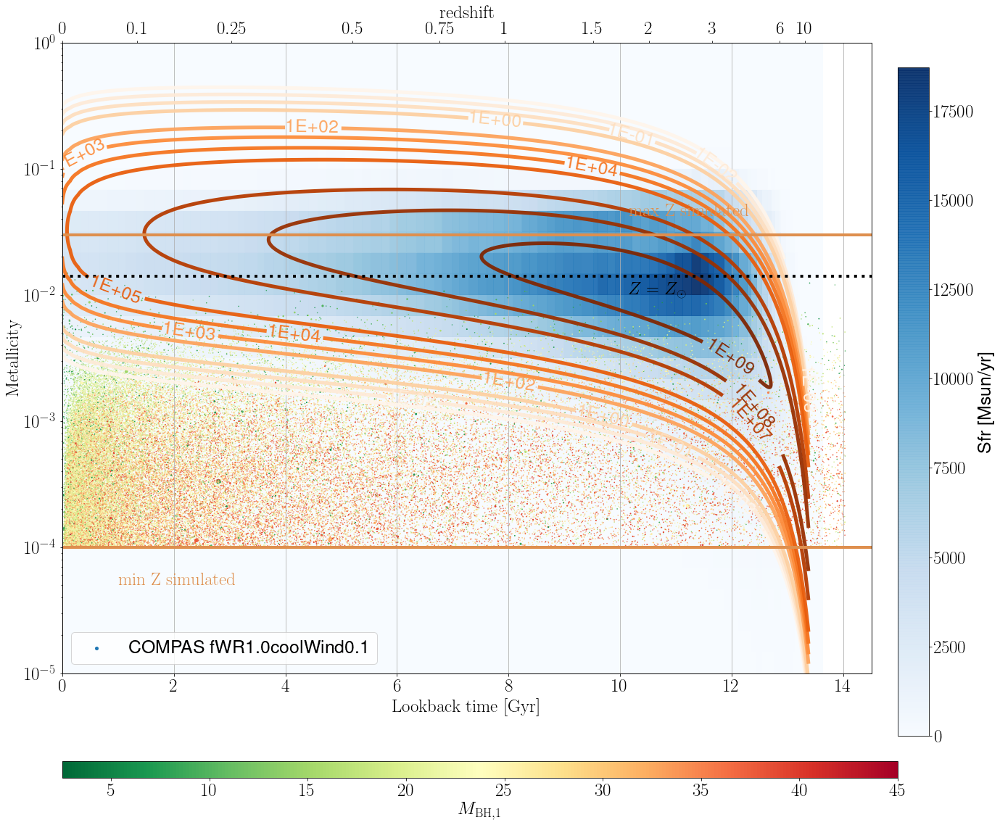

In [1190]:

####################################################
Z0,sigma,  =0.035, 0.39
Pa = -0.23

# Get dPdZ 
dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, max_redshift = 11.0)
print('max value of dPdlogZ', np.amax(dPdlogZ )/p_draw_metallicity )

#Convert redshift to lookback time
t_lookback = cosmo.lookback_time(redshifts)

# Get the SFR
sfr = Madau_Dickinson2014(redshifts, a=0.01, d=4.7)

# Convert redshifts to volumnes and ensure all volumes are in Gpc^3
volumes = cosmo.comoving_volume(redshifts).to(u.Gpc**3).value

# split volumes into shells and duplicate last shell to keep same length
shell_volumes = np.diff(volumes)
shell_volumes = np.append(shell_volumes, shell_volumes[-1])


MSSFR = sfr*shell_volumes*dPdlogZ.T/p_draw_metallicity

metal_contours_TNG(x = t_lookback, y = metallicities, z =MSSFR ,savestr ='0.15', 
               DCO= DCO, DCO_mask = DCO_mask, scatter=True, W_i = DCO['mixture_weight'][DCO_mask], #Weight,#
               param1 = 'fWR', p1 = p1, param2 = 'coolWind', p2 =p2,
               kleur = color_pallette, kleurlabel = '$\mathrm{MSSFR \ [M_{\odot} \ yr^{-1}]}$'+ "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma) )




# Vertical Slice at lookback time/redshift

In [1058]:


###############
# Distribution as a function of Metallicity
def RedshiftSlice_dPdZ(redshift = 0.1, Z0=0.035, Pa=-0.23, sigma=0.39,s_factor = 0.0,
                       TNGlocation = '/Users/lieke/surfdrive/Documents/CompareCOMPAS/',
                       min_logZ  =-12.0, max_logZ=0.0, step_logZ = 0.01,
                       min_logZ_COMPAS = np.log(1e-4),max_logZ_COMPAS = np.log(0.03)):
    
    
    ######################################
    # Start plotting
    fig, ax = plt.subplots(figsize = (16,11))

    colors     = plt.cm.plasma(np.linspace(0.,0.9, 4)) #3rd num is the number of colours
    
    
    ######################################
    # Plot COMPAS MSSFR
    ######################################
    # get metallicity dist
    dPdlogZ, redshifts, metallicities, p_draw_metallicity = \
                        get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, s_factor = s_factor,
                                                     min_logZ  =min_logZ, max_logZ=max_logZ,
                                                     step_logZ = step_logZ, redshift_step = 0.001)
    print('\n COMPAS min metal', min(np.log10(metallicities)), 'max metals', np.round(max(np.log10(metallicities)),2) )
                    
    # Get the SFR
    sfr = Madau_Dickinson2014(redshifts, a=0.01, d=4.7)
    # Convert redshifts to volumnes and ensure all volumes are in Gpc^3
    volumes = cosmo.comoving_volume(redshifts).to(u.Gpc**3).value
    # split volumes into shells and duplicate last shell to keep same length
    shell_volumes = np.diff(volumes)
    shell_volumes = np.append(shell_volumes, shell_volumes[-1])

    # Determine your slice of interest
    redshift_i = np.digitize(redshift, redshifts) -1
    print('looking at redschift ', redshifts[redshift_i])
    LookbackTime = cosmo.lookback_time(redshifts[redshift_i])
    print('This corresponds to LookbackTime', LookbackTime)
    
    # Now the MSSFR = sfr x volume at redshift x dPdZ
    MSSFR = sfr[redshift_i] * shell_volumes[redshift_i] *dPdlogZ[redshift_i, :]/p_draw_metallicity

    # Plot it!
    print('IS COMPAS NORMALIZED?', sum(MSSFR/sum(MSSFR)) )
    binwCOMPAS = step_logZ/np.log(10)
    print('binwCOMPAS', binwCOMPAS)
    ax.plot(np.log10(metallicities), (MSSFR/sum(MSSFR)) , lw = 4, 
             label = "$\mathrm{COMPAS:}$ $%s, %s$"%(redshifts[redshift_i], np.round(LookbackTime,2)), c = colors[0])
    
    ######################################
    # Fiducial COMPAS
    # get metallicity dist
    dPdlogZ_fid, redshifts_fid, metallicities_fid, p_draw_metallicity_fid = \
                        get_metallicity_distribution(Z0=0.035, alpha=-0.23, sigma=0.39, s_factor = 0.,
                                                     min_logZ  =min_logZ, max_logZ=max_logZ,
                                                     step_logZ = step_logZ, redshift_step = 0.001)                    
    # Get the SFR
    MSSFR_fid = sfr[redshift_i] * shell_volumes[redshift_i] *dPdlogZ_fid[redshift_i, :]/p_draw_metallicity_fid
    ax.plot(np.log10(metallicities_fid), (MSSFR_fid/sum(MSSFR_fid)), lw = 4, alpha = 0.5,
             label = "$\mathrm{COMPAS \ fiducial}$", c = 'grey')
    
    
    ######################################
    # Plot TNG MSSFR
    ######################################
    with h5py.File(TNGlocation+"SFRMetallicityFromGasTNG100.hdf5", "r") as f:
        MetalBins     = f["MetalBins"][:]
        Lookbacktimes = f["Lookbacktimes"][:]
        Sfr           = f["Sfr"][:]
        
    print('\n TNG min metal', min(np.log10(MetalBins)), 'max metals', max(np.log10(MetalBins)))
    binwTNG = np.diff(np.log10(MetalBins))
    print('binwTNG', binwTNG[0])
    center_Zbin = (MetalBins[:-1] + MetalBins[1:])/2.
    lookbackTime_i = np.digitize(LookbackTime.value, Lookbacktimes) 

    print('TNG lookback time', Lookbacktimes[lookbackTime_i])
    print('IS TNG NORMALIZED?', sum(Sfr[lookbackTime_i,:]/sum(Sfr[lookbackTime_i,:])) )
    
    # Plot it (normalized)
    ax.plot(np.log10(center_Zbin), Sfr[lookbackTime_i,:]/sum(Sfr[lookbackTime_i,:]) *binwTNG , lw = 4, 
             label = "$\mathrm{TNG:}$ $%s, %s$ $\mathrm{Gyr}$"%(redshifts[redshift_i], np.round(Lookbacktimes[lookbackTime_i],2) ), c = colors[1])    
        
    ######################################
    # Show boundaries of COMPAS
    ######################################
    plt.vlines(np.log10(np.e**min_logZ_COMPAS), ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'darkorange', lw = 2, ls = '-')
    ax.text(0.19,0.25, '$min Z simulated$',#np.e**min_logZ_COMPAS - 0.00002, 3
            color = 'darkorange', size =20, rotation = 90,transform=ax.transAxes)

    plt.vlines(np.log10(np.e**max_logZ_COMPAS), ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'darkorange', lw = 2, ls = '-')
    ax.text(0.75,0.25,'$max Z simulated$',#np.e**max_logZ_COMPAS , 3
            color = 'darkorange', size =20, rotation = 90, transform=ax.transAxes)
    # And Zsun
    plt.vlines(np.log10(0.014), ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'k', lw = 2, ls = ':')
    ax.text(0.67, 0.25, '$Z = Z_{\odot}$', color = 'k', ha = 'right', transform=ax.transAxes)


    
    ######################################
    # Plotvalues
    plt.xlabel('$\mathrm{Metallicity}$')
    plt.ylabel('$\mathrm{MSSFR \ [M_{\odot} \ yr^{-1}]}$'+ "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma), size = 30)

    ax.set_xlim(-4.5, -0.5)
    ax.set_ylim(0,0.06)
#     ax.set_yscale('log')
    plt.gca().set_ylim(bottom=0)
    plt.legend(title = '$\mathrm{redshift, lookback t}$', loc = 'upper left')

    plt.savefig(save_loc + 'LognormDistMetals.pdf',  bbox_inches='tight')
    plt.show()






 COMPAS min metal -9.988773083774792 max metals 0.02
looking at redschift  0.001
This corresponds to LookbackTime 0.01444096298590975 Gyr
IS COMPAS NORMALIZED? 1.0000000000000002
binwCOMPAS 0.02388619650467885

 TNG min metal -10.0 max metals 0.0
binwTNG 0.16666666666666607
TNG lookback time 2.5720376691062256e-15
IS TNG NORMALIZED? 1.0


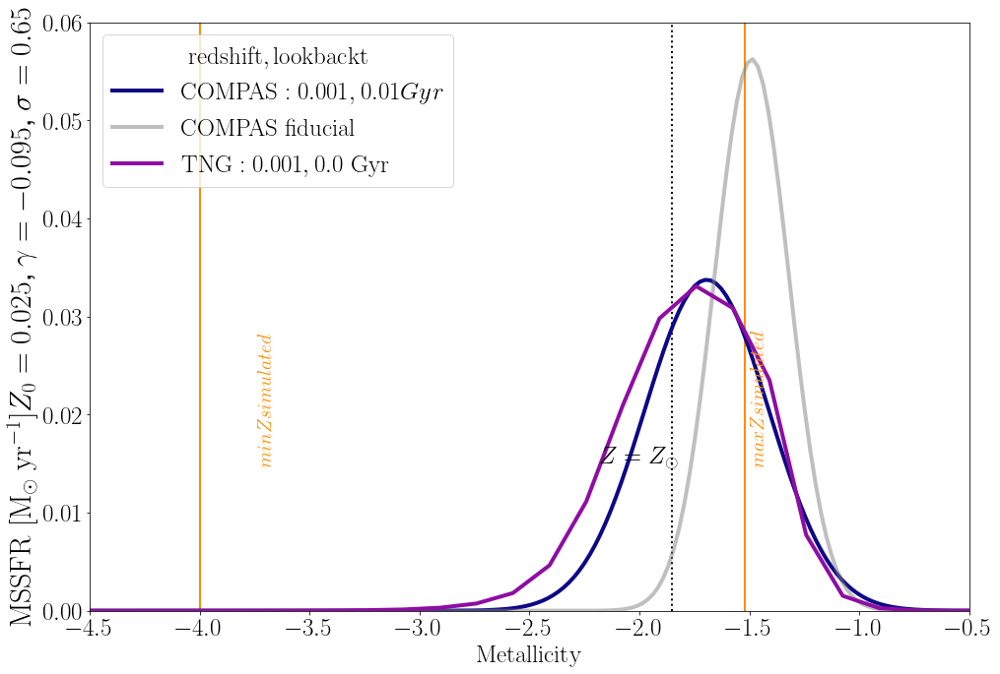


 COMPAS min metal -9.988773083774792 max metals 0.02
looking at redschift  0.084
This corresponds to LookbackTime 1.1427524872053305 Gyr
IS COMPAS NORMALIZED? 0.9999999999999999
binwCOMPAS 0.02388619650467885

 TNG min metal -10.0 max metals 0.0
binwTNG 0.16666666666666607
TNG lookback time 1.1408672518648233
IS TNG NORMALIZED? 1.0


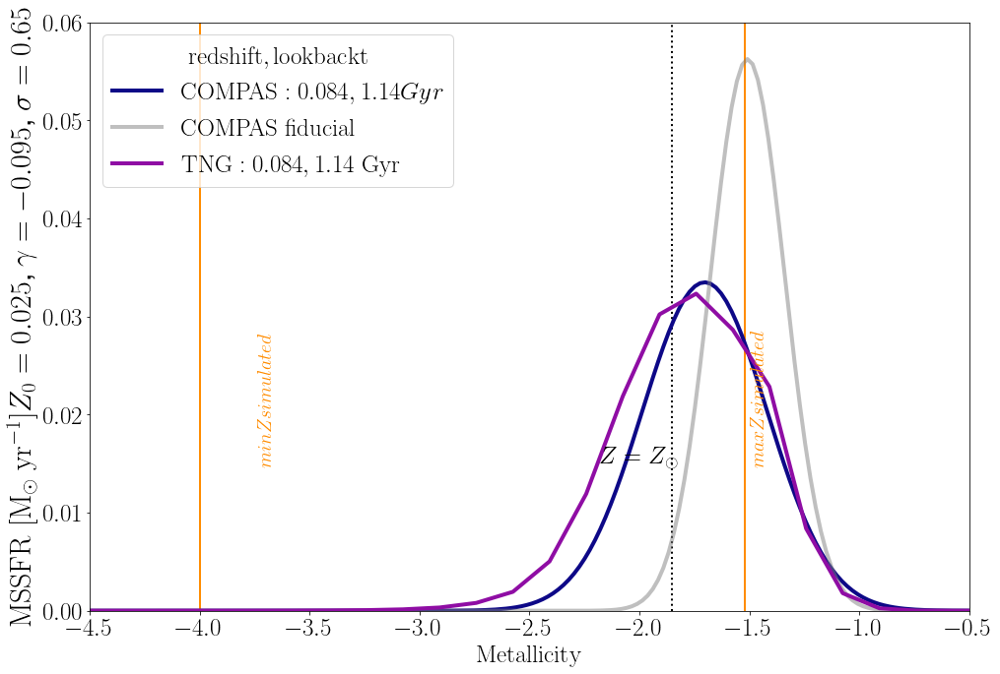


 COMPAS min metal -9.988773083774792 max metals 0.02
looking at redschift  1.5
This corresponds to LookbackTime 9.518041606555428 Gyr
IS COMPAS NORMALIZED? 0.9999999999999999
binwCOMPAS 0.02388619650467885

 TNG min metal -10.0 max metals 0.0
binwTNG 0.16666666666666607
TNG lookback time 9.516325722318772
IS TNG NORMALIZED? 1.0


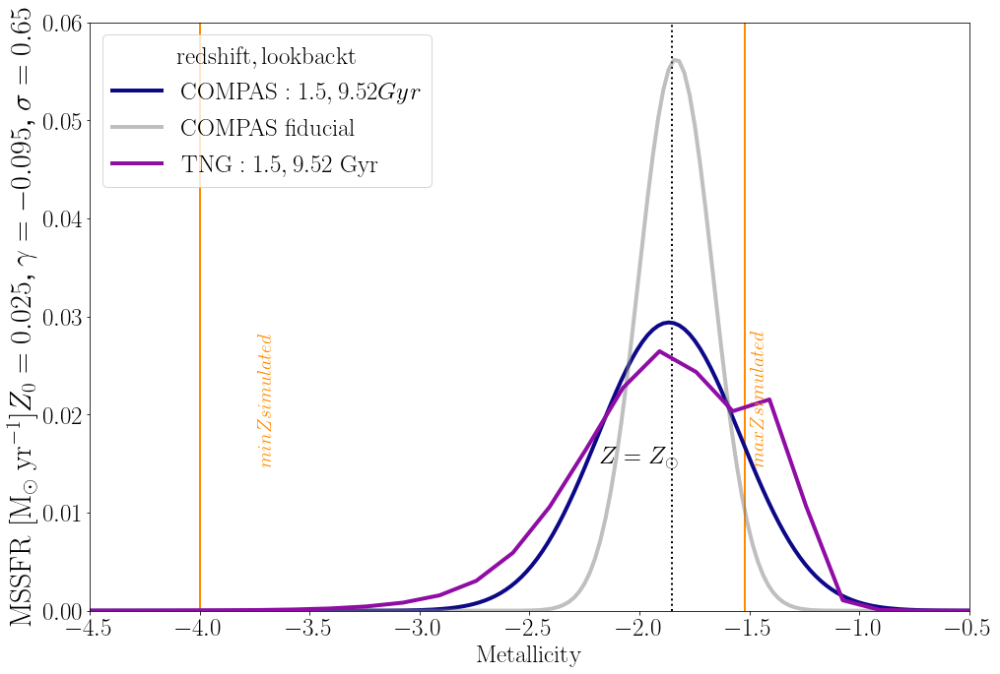


 COMPAS min metal -9.988773083774792 max metals 0.02
looking at redschift  5.0
This corresponds to LookbackTime 12.616179261012535 Gyr
IS COMPAS NORMALIZED? 1.0
binwCOMPAS 0.02388619650467885

 TNG min metal -10.0 max metals 0.0
binwTNG 0.16666666666666607
TNG lookback time 12.529645099327423
IS TNG NORMALIZED? 1.0


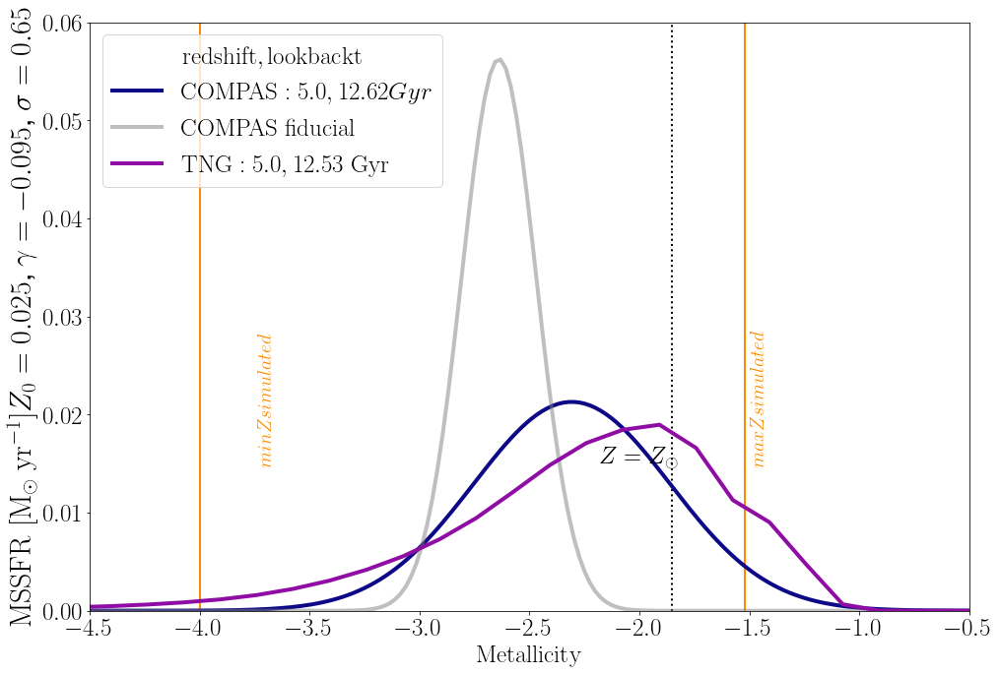


 COMPAS min metal -9.988773083774792 max metals 0.02
looking at redschift  10.0
This corresponds to LookbackTime 13.31547051921035 Gyr
IS COMPAS NORMALIZED? 1.0
binwCOMPAS 0.02388619650467885

 TNG min metal -10.0 max metals 0.0
binwTNG 0.16666666666666607
TNG lookback time 13.29491519723561
IS TNG NORMALIZED? 1.0


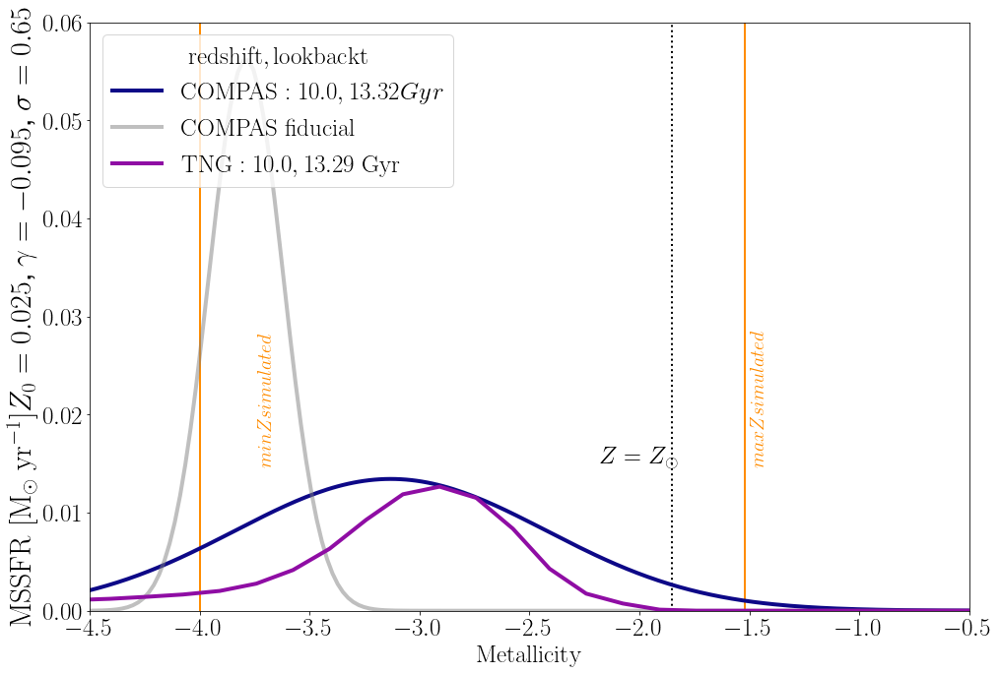

In [1069]:
Z0_fit     = 0.025 #0.035
Pa_fit     = -0.095 #-0.23
sigma_fit  = 0.65 #0.39
s_fact_fit = 0.04


for z in [0.001, 0.084, 1.5, 5, 10.]:
    RedshiftSlice_dPdZ(redshift = z,
                       Z0= Z0_fit, Pa= Pa_fit, sigma= sigma_fit,s_factor = s_fact_fit,
                       min_logZ  =-23.0, max_logZ  =0.0,step_logZ = 0.055)




/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  import sys


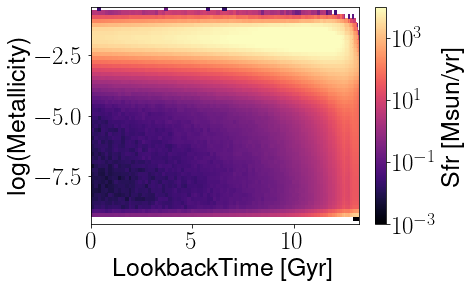

In [590]:
with h5py.File(TNGlocation+"SFRMetallicityFromGasTNG100.hdf5", "r") as f:
    MetalBins     = f["MetalBins"][:]
    Lookbacktimes = f["Lookbacktimes"][:]
    Sfr           = f["Sfr"][:]

figure()
pcolormesh( Lookbacktimes, np.log10(MetalBins), Sfr.T, rasterized=True, norm=matplotlib.colors.LogNorm(vmin=1e-3,vmax=1e4), cmap=matplotlib.cm.magma ) 
xlim(  0.0, 13.2 )
ylim( -9.5, -0.5 )
xlabel( "LookbackTime [Gyr]" )
ylabel( "log(Metallicity)" )
colorbar( label="Sfr [Msun/yr]" )
savefig( "SFRMetallicityFromGasTNG100.pdf" )

# Loop over metallicity density distributions

LBVHURLEY_ADDfWR0.1coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR0.1coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.4_sigma0.39', 'Rates_Z00.035_alpha-0.5_sigma0.39', 'SystemParameters']>
max(redshift) in data 1.0 
 max redshift used: redshift[z_index] 0.01
redshifts [0.000e+00 1.000e-02 2.000e-02 ... 4.998e+01 4.999e+01 5.000e+01] N redshifts 5001
[100. 100. 100. ... 100. 100. 100.]
5001 6.14421235332821e-06


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


77213


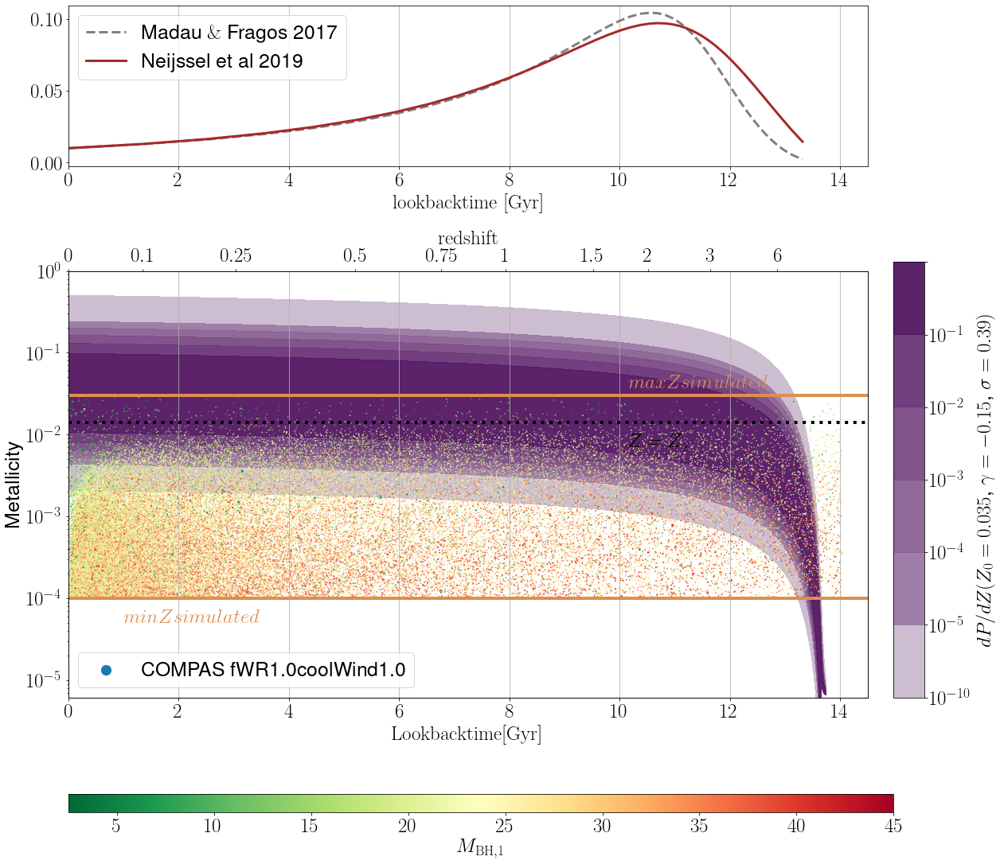

redshifts [0.000e+00 1.000e-02 2.000e-02 ... 4.998e+01 4.999e+01 5.000e+01] N redshifts 5001
[100. 100. 100. ...  nan  nan  nan]
5001 6.14421235332821e-06


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


77213


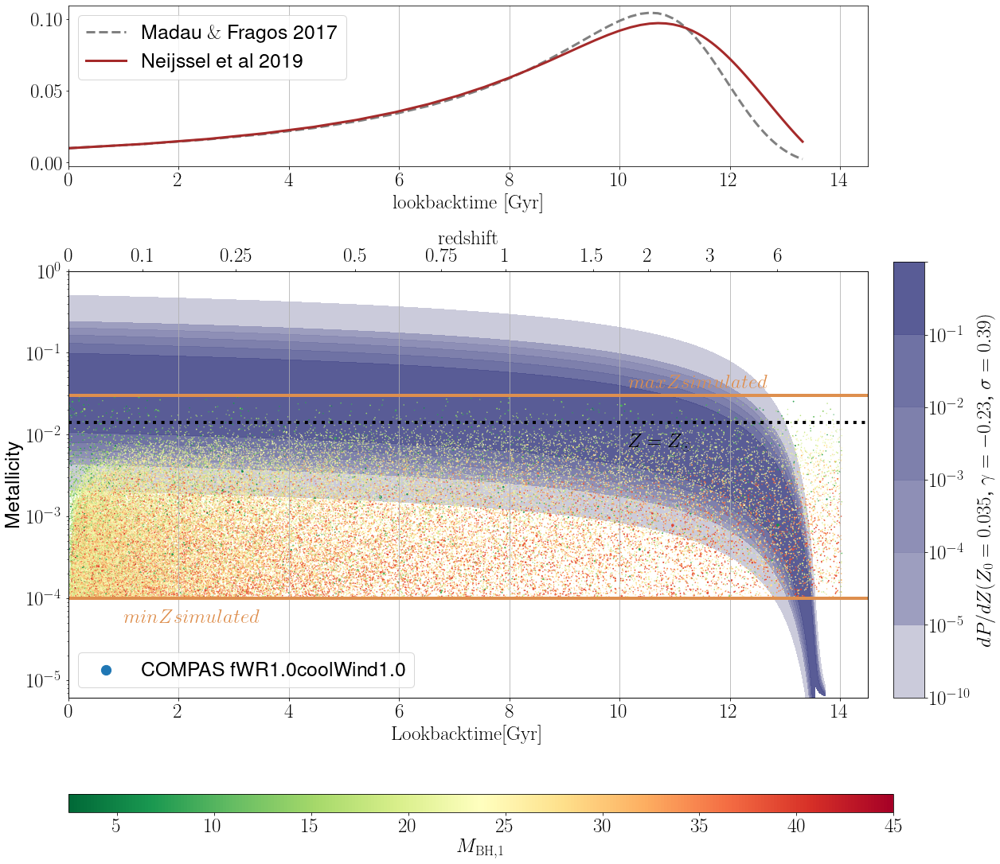

redshifts [0.000e+00 1.000e-02 2.000e-02 ... 4.998e+01 4.999e+01 5.000e+01] N redshifts 5001
[100. 100. 100. ...  nan  nan  nan]
5001 6.14421235332821e-06


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


77213


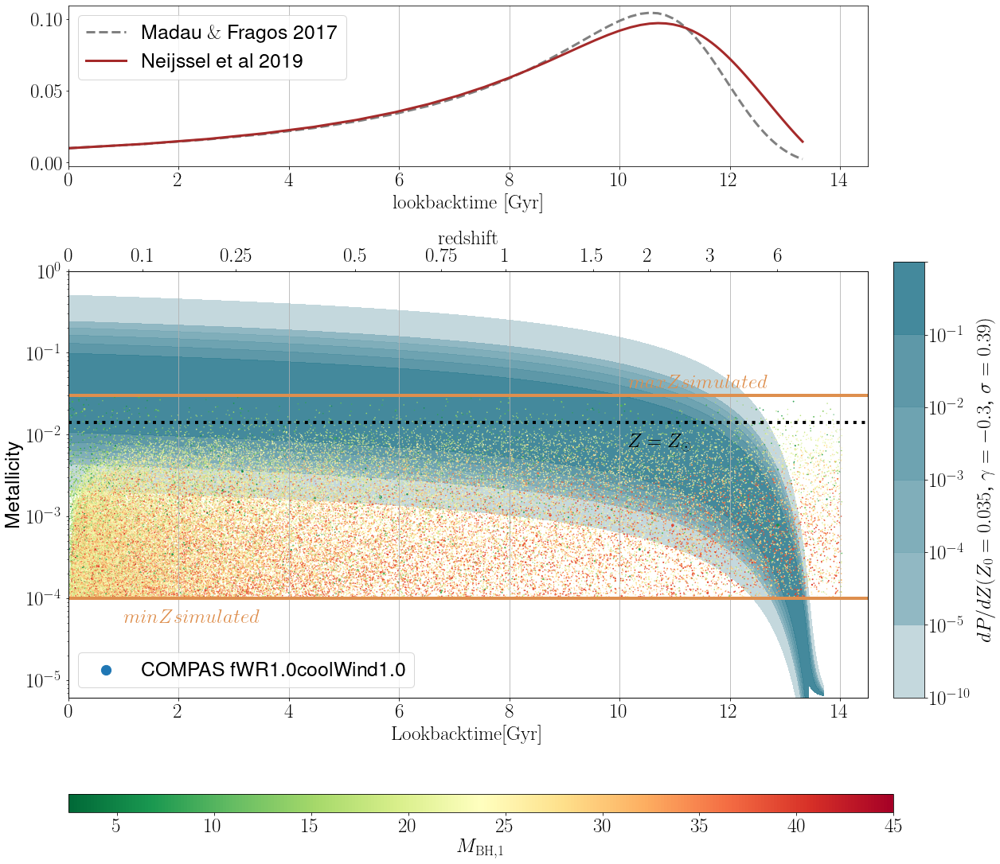

In [361]:
### ## Reading file ##
fnamestr ='LBVHURLEY_ADD'# 'LBVBELCZYNSKI'#'LBVHURLEY_ADD'#'['BELCZYNSKI', 'HURLEY_AD']
param1   = 'fWR'
p1       = 1.0
param2   = 'coolWind'
p2       = 1.0
Palpha   = -0.23

rate_key = 'Rates_Z00.035_alpha%s_sigma0.39'%(Palpha)
max_redshift = 0.01

### Get data
filename    = fnamestr+param1+str(p1)+param2+str(p2)
print(filename)
SYS, DCO, DCO_mask, Weight, WeightO3 = read_data(loc = data_dir+filename+'/output/COMPAS_Output_wWeights.h5', 
              rate_key = rate_key, maxz=max_redshift)

# Loop over cosmic integration variations
Z0,sigma,  =0.035, 0.39
for i, Pa in enumerate([-0.15, -0.23, -0.3]):
    # Get dPdZ 
    dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, max_redshift = 50.0)
    #Convert redshift to lookback time
    t_lookback = cosmo.lookback_time(redshifts)

    # make a nice colour range
    color_pallette = sns.light_palette(colormap[i], as_cmap=True, n_colors= 2)#colormap[1]'#543884'
    # Plot it!
    metal_contours(x = t_lookback, y = metallicities, z = dPdlogZ.T/p_draw_metallicity,savestr ='0.15', 
                   DCO= DCO, DCO_mask = DCO_mask,
                   kleur = color_pallette, kleurlabel = "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma))



    

# Loop over WR variations

redshifts [0.000e+00 1.000e-02 2.000e-02 ... 4.998e+01 4.999e+01 5.000e+01] N redshifts 5001
[100. 100. 100. ...  nan  nan  nan]
5001 6.14421235332821e-06


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


LBVHURLEY_ADDfWR0.1coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR0.1coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.4_sigma0.39', 'Rates_Z00.035_alpha-0.5_sigma0.39', 'SystemParameters']>
max(redshift) in data 1.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


204399


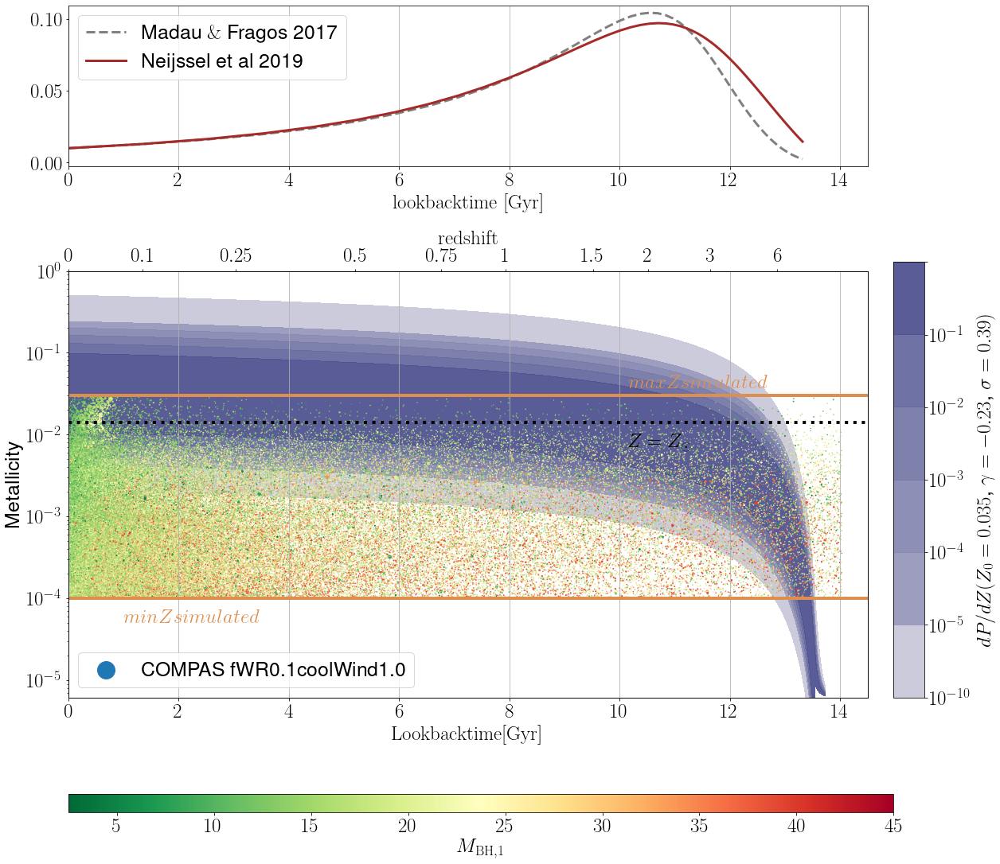

LBVHURLEY_ADDfWR0.5coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR0.5coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


191625


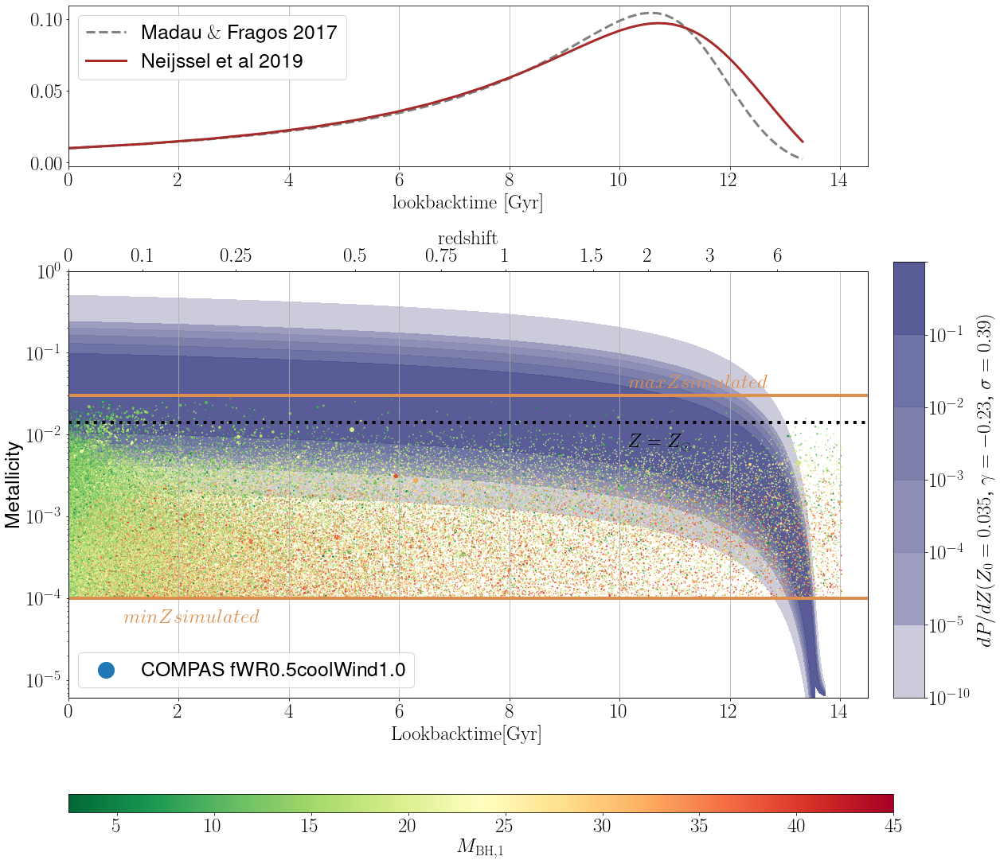

LBVHURLEY_ADDfWR1.0coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR1.0coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


187596


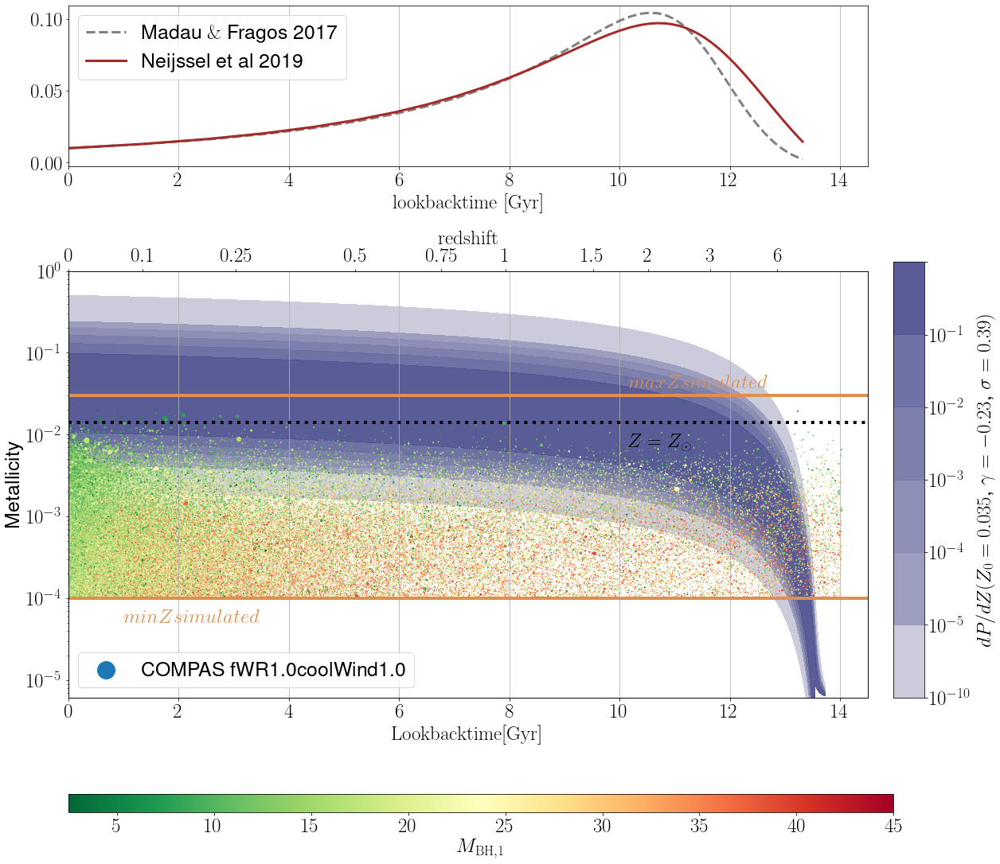

LBVHURLEY_ADDfWR2.0coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR2.0coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


166367


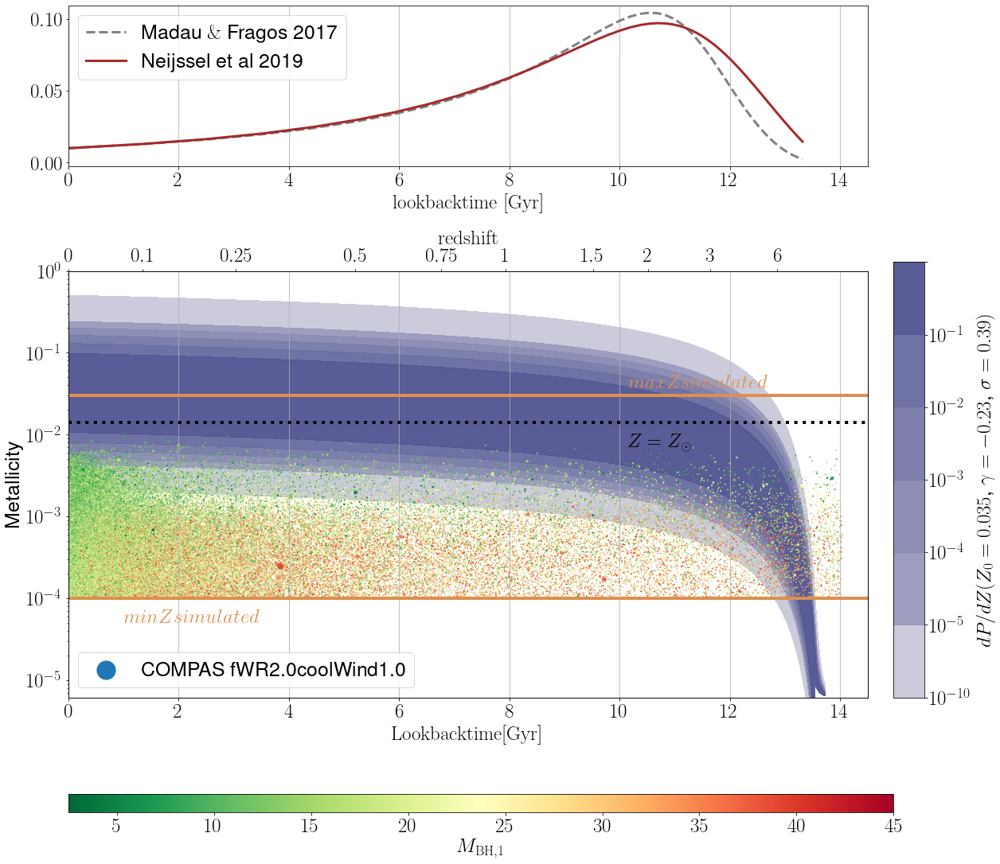

LBVHURLEY_ADDfWR5.0coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR5.0coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


132144


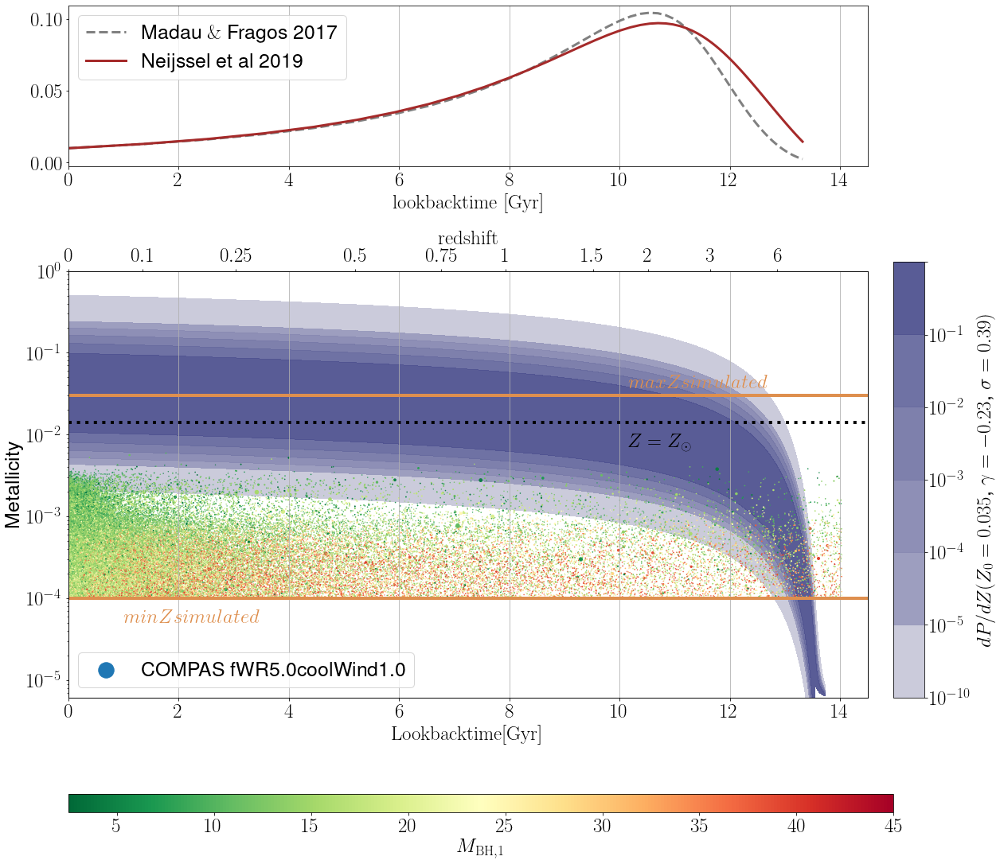

In [354]:
### ## general file names ##
fnamestr ='LBVHURLEY_ADD'# 
param1   = 'fWR'
param2   = 'coolWind'
p2       = 1.0
Palpha   = -0.23
rate_key = 'Rates_Z00.035_alpha%s_sigma0.39'%(Palpha)
max_redshift = 0.01


# params for dP/dZ
Z0,sigma, Pa  =0.035, 0.39, -0.23
# Get dPdZ 
dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, max_redshift = 50.0)
#Convert redshift to lookback time
t_lookback = cosmo.lookback_time(redshifts)



# make a nice colour range
color_pallette = sns.light_palette(colormap[1], as_cmap=True, n_colors= 2)#colormap[1]'#543884'




# Loop over WR variations
for i, p1 in enumerate([0.1,0.5,1.0, 2.0, 5.0]):
    
    ### Read the data ###
    filename    = fnamestr+param1+str(p1)+param2+str(p2)
    print(filename)
    SYS, DCO, DCO_mask, Weight, WeightO3 = read_data(loc = data_dir+filename+'/output/COMPAS_Output_wWeights.h5', 
                  rate_key = rate_key, maxz=max_redshift)

    # Plot it!
    metal_contours(x = t_lookback, y = metallicities, z = dPdlogZ.T/p_draw_metallicity,savestr ='0.15', 
                   DCO= DCO, DCO_mask = DCO_mask,
                   param1 = 'fWR', p1 = p1, param2 = 'coolWind', p2 =1.0,
                   kleur = color_pallette, kleurlabel = "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma))



    

# Loop over cool winds

redshifts [0.000e+00 1.000e-02 2.000e-02 ... 4.998e+01 4.999e+01 5.000e+01] N redshifts 5001
[100. 100. 100. ...  nan  nan  nan]
5001 6.14421235332821e-06


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in true_divide
/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


LBVHURLEY_ADDfWR1.0coolWind0.1
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR1.0coolWind0.1/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


188967


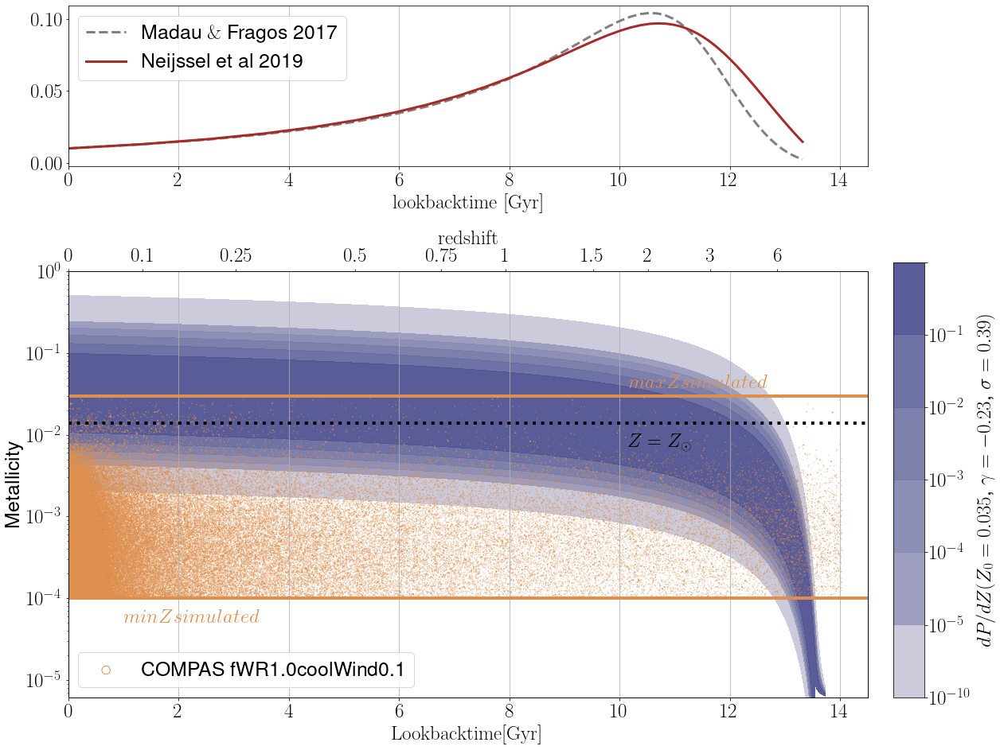

LBVHURLEY_ADDfWR1.0coolWind1.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR1.0coolWind1.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


187596


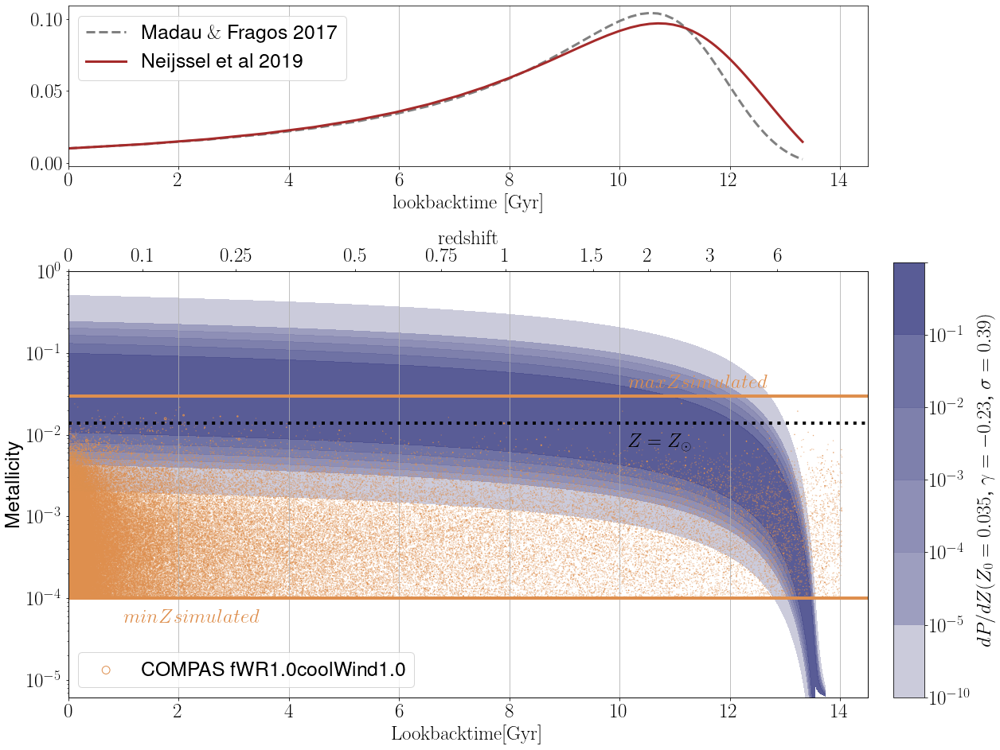

LBVHURLEY_ADDfWR1.0coolWind10.0
Reading  /Volumes/TOSHIBA_EXT//CompasOutput//v02.17.18/N1e6_CoolWind_fWR_LBV/LBVHURLEY_ADDfWR1.0coolWind10.0/output/COMPAS_Output_wWeights.h5
<KeysViewHDF5 ['DoubleCompactObjects', 'Rates_Z00.035_alpha-0.15_sigma0.39', 'Rates_Z00.035_alpha-0.23_sigma0.39', 'Rates_Z00.035_alpha-0.3_sigma0.39', 'Rates_Z00.035_alpha-0.43_sigma0.39', 'Rates_Z00.035_alpha-0.63_sigma0.39', 'SystemParameters']>
max(redshift) in data 10.0 
 max redshift used: redshift[z_index] 0.01


/Users/lieke/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Log scale: values of z <= 0 have been masked


135243


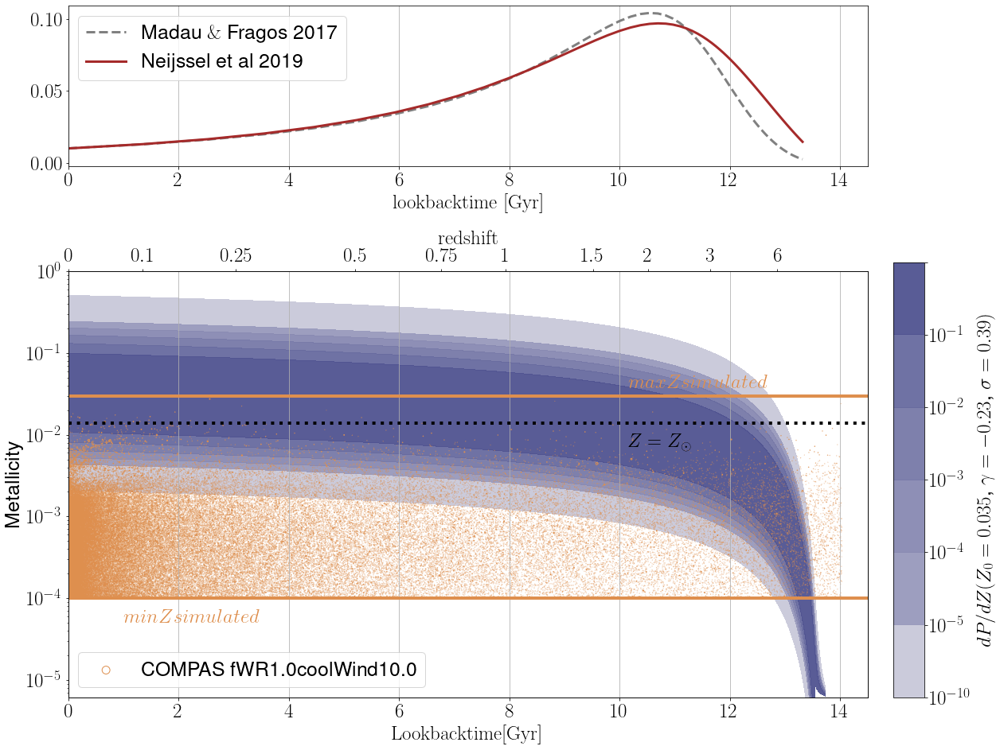

In [311]:
### ## general file names ##
fnamestr ='LBVHURLEY_ADD'# 
param1   = 'fWR'
p1       = 1.0
param2   = 'coolWind'
Palpha   = -0.23
rate_key = 'Rates_Z00.035_alpha%s_sigma0.39'%(Palpha)
max_redshift = 0.01


# params for dP/dZ
Z0,sigma, Pa  =0.035, 0.39, -0.23
# Get dPdZ 
dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(Z0=Z0, alpha=Pa, sigma=sigma, max_redshift = 50.0)
#Convert redshift to lookback time
t_lookback = cosmo.lookback_time(redshifts)



# make a nice colour range
color_pallette = sns.light_palette(colormap[1], as_cmap=True, n_colors= 2)#colormap[1]'#543884'




# Loop over Cool wind variations
for i, p2 in enumerate([0.1,1.0,10.0]):
    
    ### Read the data ###
    filename    = fnamestr+param1+str(p1)+param2+str(p2)
    print(filename)
    SYS, DCO, DCO_mask, Weight, WeightO3 = read_data(loc = data_dir+filename+'/output/COMPAS_Output_wWeights.h5', 
                  rate_key = rate_key, maxz=max_redshift)

    # Plot it!
    metal_contours(x = t_lookback, y = metallicities, z = dPdlogZ.T/p_draw_metallicity,savestr ='0.15', 
                   DCO= DCO, DCO_mask = DCO_mask,
                   param1 = 'fWR', p1 = 1.0, param2 = 'coolWind', p2 =p2,
                   kleur = color_pallette, kleurlabel = "$Z_0=%s$, $\gamma=%s$, $\sigma=%s$"%(Z0, Pa, sigma))



    

# Lognormal representation of dP/dZ


redshifts [ 0.    0.01  0.02 ...  9.98  9.99 10.  ] N redshifts 1001
[100. 100. 100. ... 100. 100. 100.]
1001 6.14421235332821e-06
redshifts [ 0.    0.01  0.02 ...  9.98  9.99 10.  ] N redshifts 1001
[100. 100. 100. ... 100. 100. 100.]
1001 6.14421235332821e-06


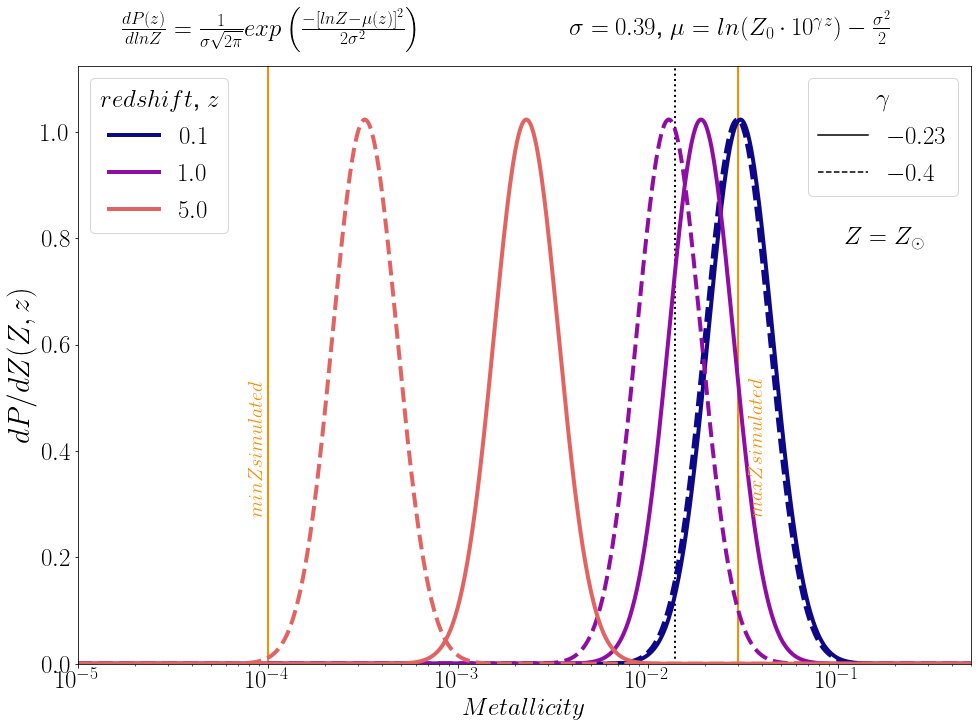

In [15]:

###############
# Distribution as a function of Metallicity
def plot_dPdZ(min_logZ_COMPAS = np.log(1e-4),max_logZ_COMPAS = np.log(0.03), step_logZ = 0.01):
    
    ###############
    # get metallicity dist
    dPdlogZ, redshifts, metallicities, p_draw_metallicity = get_metallicity_distribution(#min_logZ=min_logZ_COMPAS, max_logZ=max_logZ_COMPAS,
                                                                                         Z0=0.035, alpha=-0.23, sigma=0.39)
    dPdlogZ_shift, redshifts_shift, metallicities_shift, p_draw_metallicity_shift = get_metallicity_distribution(#min_logZ=min_logZ_COMPAS, max_logZ=max_logZ_COMPAS,
                                                                                                                 Z0=0.035, alpha=-0.4, sigma=0.39)

    colors     = plt.cm.plasma(np.linspace(0.,0.9, 4)) #3rd num is the number of colours
    
    fig, ax = plt.subplots(figsize = (16,11))

    for i, redshift_i in enumerate([10,100, 500]):
        plt.plot(metallicities, dPdlogZ[redshift_i, :], lw = 4, #/p_draw_metallicity,
                 label = "$%s$"%(redshifts[redshift_i]), c = colors[i])
        plt.plot(metallicities, (dPdlogZ_shift[redshift_i, :]), lw = 4, #/p_draw_metallicity_shift
                 label = None, ls= '--', c = colors[i])

    # Show boundaries of COMPAS
    plt.vlines(np.e**min_logZ_COMPAS, ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'darkorange', lw = 2, ls = '-')
    ax.text(0.19,0.25, '$min Z simulated$',#np.e**min_logZ_COMPAS - 0.00002, 3
            color = 'darkorange', size =20, rotation = 90,transform=ax.transAxes)

    plt.vlines(np.e**max_logZ_COMPAS, ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'darkorange', lw = 2, ls = '-')
    ax.text(0.75,0.25,'$max Z simulated$',#np.e**max_logZ_COMPAS , 3
            color = 'darkorange', size =20, rotation = 90, transform=ax.transAxes)

    # And Zsun
    plt.vlines(0.014, ymin=0, ymax = 1,transform=ax.get_xaxis_transform(),
               color = 'k', lw = 2, ls = ':')
    ax.text(0.95, 0.7, '$Z = Z_{\odot}$', color = 'k', ha = 'right', transform=ax.transAxes)
#     ax.text(0.013, 6.2, '$Z = Z_{\odot}$', color = 'k', ha = 'right')

    # Equations
    plt.text(0.05,1.05,r"$\frac{dP(z)}{dlnZ} = \frac{1}{\sigma \sqrt{2\pi}} exp\left( \frac{-[lnZ - \mu(z)]^2}{2\sigma^2} \right)$", transform=ax.transAxes)
    plt.text(0.55,1.05,r"$\sigma = 0.39$, $\mu = ln( Z_0 \cdot 10^{\gamma z} ) - \frac{\sigma^2}{2}$", transform=ax.transAxes)


    # # Add extra legend for gamma
    plot_lines = []
    l1, = plt.plot( (1e-4, 1e-1), (-1,-1), '-', color='k')
    l2, = plt.plot( (1e-4, 1e-1), (-1,-1), '--', color='k')
    plot_lines.append([l1, l2])
    legend1 = plt.legend(plot_lines[0], ["$-0.23$", "$-0.4$"], loc='upper right', title = "$\gamma$")
    plt.legend([l[0] for l in plot_lines], ["alpha = -0.23", "alpha = -0.43"] ,loc=4)
    plt.gca().add_artist(legend1)

    plt.xlabel('$Metallicity$')
    plt.ylabel('$dP/dZ(Z,z)$', size = 30)
    plt.xscale('log')
    plt.xlim(1e-5, 5e-1)
#     plt.ylim(0,0.03)
    plt.gca().set_ylim(bottom=0)
    plt.legend(title = '$redshift$, $z$', loc = 'upper left')

    plt.savefig(save_loc + 'LognormDistMetals.pdf',  bbox_inches='tight')
    plt.show()


plot_dPdZ()
